## Import modules

In [5]:
from pathlib import Path

import requests
import zipfile
import io

import pandas as pd
import numpy as np

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio

from sklearn.cluster import DBSCAN

from utils import (unpack_datetime, UnpackWhat)

# Earth's radius / kilometers in one radian
EARTH_RADIUS_KM = 6371.0

pio.renderers.default = "jupyterlab+png"

## Recupération des data

In [6]:
# URL of the ZIP file
JEDHA_DATASET_URL = "https://full-stack-bigdata-datasets.s3.eu-west-3.amazonaws.com/Machine+Learning+non+Supervis%C3%A9/Projects/uber-trip-data.zip"

# base DATA folder
DATA_BASE_DIR = Path.joinpath(Path.cwd(), 'data')
DATA_BASE_DIR.mkdir(exist_ok=True)

# raw data folder
RAW_DATA_DIR = DATA_BASE_DIR / "raw"
RAW_DATA_DIR.mkdir(exist_ok=True)

# if nothing in raw folder, download and unzip JEDHA dataset archive
if not any(RAW_DATA_DIR.iterdir()):
    print("RAW data folder is empty. Downloading and extracting data...")

    response = requests.get(JEDHA_DATASET_URL)
    response.raise_for_status()  # Ensure the request was successful

    # print("Unzipping the contents...")
    # with zipfile.ZipFile(io.BytesIO(response.content)) as zip_ref:
    #     zip_ref.extractall(DATA_BASE_DIR)


    # Just extract the content of 'uber-trip-data/' folder
    print("Extracting 'uber-trip-data/' contents...")
    with zipfile.ZipFile(io.BytesIO(response.content)) as zip_ref:
        for member in zip_ref.namelist():
            if member.startswith("uber-trip-data/") and not member.endswith("/"):
                # Extract into our destination directory (removing the top folder name)
                relative_path = Path(member).relative_to("uber-trip-data")
                target_path = RAW_DATA_DIR / relative_path
                target_path.parent.mkdir(parents=True, exist_ok=True)
                with zip_ref.open(member) as source, open(target_path, "wb") as target:
                    target.write(source.read())

    print(f"Extraction completed. Files are in: {RAW_DATA_DIR.resolve()}")
else:
    print(f"RAW data folder is not empty. Skipping download. Contents already exist in: {RAW_DATA_DIR.resolve()}")
    
# Lister les fichiers extraits
print("\nListe des fichiers disponibles :")
for path in RAW_DATA_DIR.rglob("*"):
    if path.is_file():
        print(f"- {path.relative_to(RAW_DATA_DIR)}")

RAW data folder is not empty. Skipping download. Contents already exist in: /workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw

Liste des fichiers disponibles :
- taxi-zone-lookup.csv
- uber-raw-data-apr14.csv
- uber-raw-data-aug14.csv
- uber-raw-data-janjune-15.csv.zip
- uber-raw-data-jul14.csv
- uber-raw-data-jun14.csv
- uber-raw-data-may14.csv
- uber-raw-data-sep14.csv


## Chargement des données

In [7]:
raw_data_files_2014 = [file for file in RAW_DATA_DIR.glob('uber-raw-data*.csv')]
raw_data_files_2014.sort()

print("Nb of files: ", len(raw_data_files_2014))
print(raw_data_files_2014)

Nb of files:  6
[PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-apr14.csv'), PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-aug14.csv'), PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-jul14.csv'), PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-jun14.csv'), PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-may14.csv'), PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-sep14.csv')]


In [8]:
# Load N file (1 to 6)
NB_FILES_TO_LOAD = 6

raw_data_df = pd.concat(map(pd.read_csv, raw_data_files_2014[0:NB_FILES_TO_LOAD]))

# normalize column names
raw_data_df.columns = ['date_time', 'lat', 'lon', 'base']

# Convert datetime
raw_data_df['date_time'] = pd.to_datetime(raw_data_df['date_time'])

# Unpack datetime
unpack_datetime(raw_data_df, 'date_time', UnpackWhat.ALL, prefix='dt', inplace=True)

# Pour réduire/recentrer les datas on va appliquer un filtrage des outliers aux colonnes latitude et longitude
print("Initial shape: ", raw_data_df.shape)

for col in ["lat", "lon"] :
    col_mean = raw_data_df[col].mean()
    col_std = raw_data_df[col].std()
    range_min = col_mean - 3 * col_std
    range_max = col_mean + 3 * col_std
  
    raw_data_df = raw_data_df[(raw_data_df[col] > range_min) & (raw_data_df[col] <= range_max)]
    
print("New Shape: ", raw_data_df.shape)

Initial shape:  (4534327, 14)
New Shape:  (4301626, 14)


## Clustering

### Generalisation

Let try an all-in-one visualization!

Visualize hours of weekdays

In [9]:
# Let assign clusters on a daily basis!
# 1. copy dataframe and limit to 10000 rides per day (DBSCAN memory consumption is hudge!)
report_viz_df = raw_data_df.copy().groupby("dt_weekday").sample(100000).reset_index(drop=True)

# 2. convert lat/lon to radians
# Prepare dataset
# 1. select features
report_viz_df[["lat_rad", "lon_rad"]] = np.radians(report_viz_df[["lat", "lon"]])
report_viz_df

,date_time,lat,lon,base,dt_date,dt_year,dt_month,dt_week,dt_day,dt_day_name,dt_weekday,dt_hour,dt_minute,dt_second,lat_rad,lon_rad
0,2014-07-21 18:00:00,40.7632,-73.9800,B02617,2014-07-21,2014,7,30,21,Monday,0,18,0,0,0.711452,-1.291195
1,2014-05-05 17:27:00,40.7582,-73.9765,B02682,2014-05-05,2014,5,19,5,Monday,0,17,27,0,0.711365,-1.291133
2,2014-07-21 15:31:00,40.7696,-73.9896,B02598,2014-07-21,2014,7,30,21,Monday,0,15,31,0,0.711564,-1.291362
3,2014-04-21 09:37:00,40.7526,-73.9841,B02617,2014-04-21,2014,4,17,21,Monday,0,9,37,0,0.711267,-1.291266
4,2014-06-16 13:31:00,40.6774,-73.8872,B02682,2014-06-16,2014,6,25,16,Monday,0,13,31,0,0.709955,-1.289575
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
699995,2014-08-31 18:34:00,40.7307,-73.8939,B02598,2014-08-31,2014,8,35,31,Sunday,6,18,34,0,0.710885,-1.289692
699996,2014-06-08 01:12:00,40.7077,-73.9450,B02682,2014-06-08,2014,6,23,8,Sunday,6,1,12,0,0.710483,-1.290584
699997,2014-09-07 15:12:00,40.7169,-74.0079,B02617,2014-09-07,2014,9,36,7,Sunday,6,15,12,0,0.710644,-1.291682
699998,2014-06-22 06:55:00,40.7850,-73.9558,B02682,2014-06-22,2014,6,25,22,Sunday,6,6,55,0,0.711833,-1.290772


In [10]:
# prepare DBSCAN
# radius km
EPS_KM = 1.27

# eps: distance threshold that determines the maximum distance between two points for them to be considered part of the same cluster.
epsilon = EPS_KM / EARTH_RADIUS_KM

min_samples = 5

dbscan = DBSCAN(eps=epsilon, min_samples=min_samples, metric="haversine", algorithm="ball_tree")

In [11]:
report_viz_df["dbscan_cluster"] = -1

day_mapping = report_viz_df.drop_duplicates(subset=["dt_weekday", "dt_day_name"]) \
                .sort_values("dt_weekday") \
                .set_index("dt_weekday")["dt_day_name"] \
                .to_dict()

# Loop over weekdays
for weekday in report_viz_df["dt_weekday"].unique():
    # Loop over hours of day
    for hour in range(0, 24):
        print(f"Weekday {weekday} ({day_mapping[weekday]}) @ {hour:2d}h:")
        dbscan_subset_df = report_viz_df[(report_viz_df["dt_weekday"] == weekday) & (report_viz_df["dt_hour"] == hour)][["lat_rad", "lon_rad"]]
        print("shape: ", dbscan_subset_df.shape)

        dbscan.fit(dbscan_subset_df)

        dbscan_subset_df["dbscan_cluster"] = dbscan.labels_

        report_viz_df.loc[dbscan_subset_df.index, "dbscan_cluster"] = dbscan_subset_df["dbscan_cluster"]

        print(f"Found {dbscan_subset_df['dbscan_cluster'].unique()} clusters on {day_mapping[weekday]}")

Weekday 0 (Monday) @  0h:
shape:  (1096, 2)
Found [ 0  1 -1  7  2  3  4  5  6] clusters on Monday
Weekday 0 (Monday) @  1h:
shape:  (686, 2)
Found [ 0 -1  1  2] clusters on Monday
Weekday 0 (Monday) @  2h:
shape:  (542, 2)
Found [ 0 -1  1  2  5  3  4  6] clusters on Monday
Weekday 0 (Monday) @  3h:
shape:  (1228, 2)
Found [ 0 -1  1  2] clusters on Monday
Weekday 0 (Monday) @  4h:
shape:  (1660, 2)
Found [ 0  1 -1  2  3  4  6  5] clusters on Monday
Weekday 0 (Monday) @  5h:
shape:  (2661, 2)
Found [ 0  1 -1  2  3  4  5] clusters on Monday
Weekday 0 (Monday) @  6h:
shape:  (4295, 2)
Found [ 0  1 -1  3  5  2  4] clusters on Monday
Weekday 0 (Monday) @  7h:
shape:  (5830, 2)
Found [ 0  1 -1  2  3] clusters on Monday
Weekday 0 (Monday) @  8h:
shape:  (5591, 2)
Found [ 0 -1  1  2  3] clusters on Monday
Weekday 0 (Monday) @  9h:
shape:  (4165, 2)
Found [ 0  1  2 -1  3  4  7  5  6] clusters on Monday
Weekday 0 (Monday) @ 10h:
shape:  (3873, 2)
Found [ 0 -1  1  2] clusters on Monday
Weekday 0 (

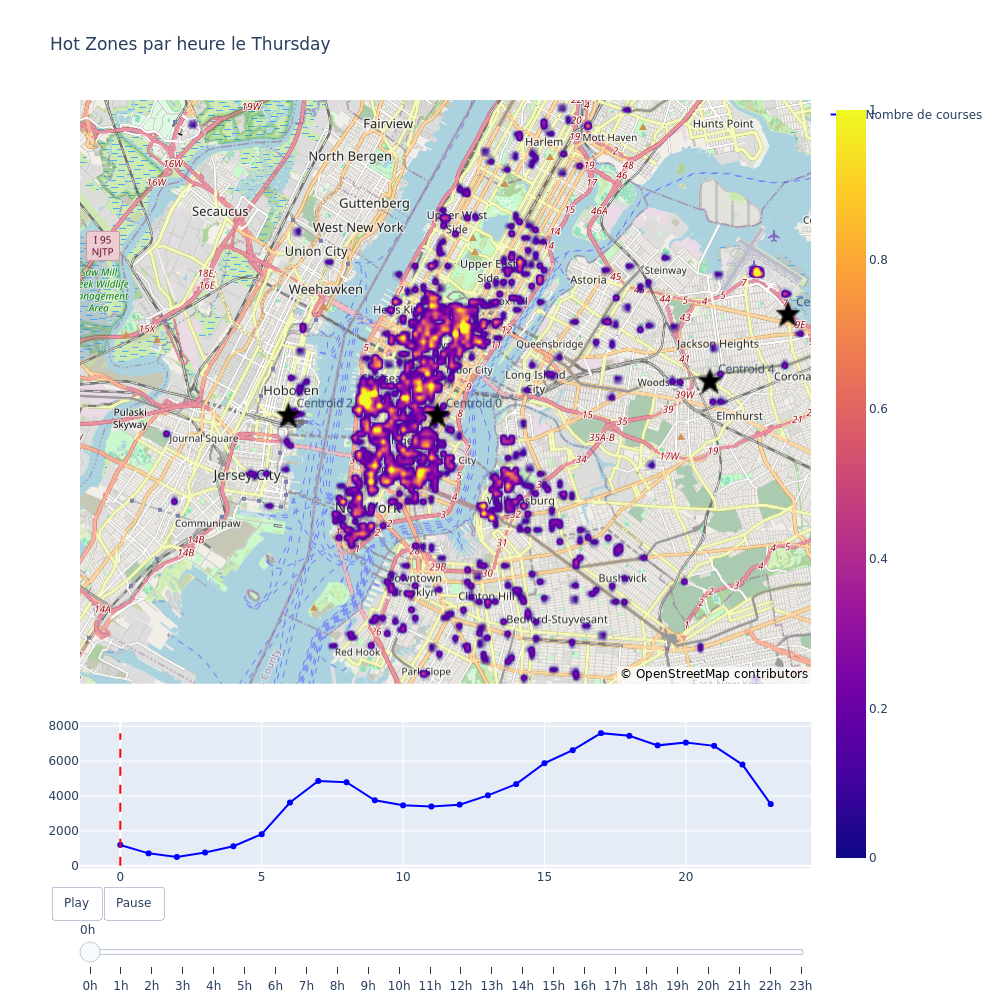

In [12]:
weekday = 3 # Thursday

day_df = report_viz_df[report_viz_df["dt_weekday"] == weekday]
day_clusters_centroids_df = day_df[day_df["dbscan_cluster"] != -1].groupby(["dt_hour", "dbscan_cluster"])[["lat", "lon"]].mean().reset_index()

# Nombre de courses par heure
hourly_counts = day_df['dt_hour'].value_counts().sort_index()
line_chart = go.Scatter(
    x=hourly_counts.index,
    y=hourly_counts.values,
    mode='lines+markers',
    name='Nombre de courses',
    line=dict(color='blue')
)

# Base map settings
mapbox_style = "open-street-map" #"carto-positron"
mapbox_center = {"lat": day_df["lat"].mean(), "lon": day_df["lon"].mean()}

# Créer les frames pour chaque heure
frames = []
fig_0 = None
for hour in sorted(day_df["dt_hour"].unique()):
    hourly_df = day_df[day_df["dt_hour"] == hour]
    hourly_centroids_df = day_clusters_centroids_df[day_clusters_centroids_df["dt_hour"] == hour]
    fig_hour = px.density_map(
        hourly_df,
        lat="lat",
        lon="lon",
        z=None,
        radius=5,
        center=mapbox_center,
        zoom=11,
        map_style=mapbox_style,
    )
    
    fig_hour.add_trace(go.Scattermap(
        lat=hourly_centroids_df["lat"],
        lon=hourly_centroids_df["lon"],
        mode="markers+text",
        marker=dict(
            size=18,
            color="black",
            symbol="star"
        ),
        # name="",
        showlegend=False,
        text=[f"Centroid {i}" for i in hourly_centroids_df.index],
        textposition="top right",
        subplot="map"
    ))

    if not fig_0:
        fig_0 = fig_hour
    # fig_hour.update_layout(
    #     margin=dict(l=10, r=10, t=50, b=10),
    # )

    # fig_hour.update_layout(height=1000, width=1000)
    # Ligne verticale animée (sous forme de "shape")
    shape = {
        "type": "line",
        "xref": "x",
        "yref": "y",
        "x0": hour,
        "x1": hour,
        "y0": 0,
        "y1": hourly_counts.max(),
        "line": {"color": "red", "width": 2, "dash": "dash"}
    }

    frames.append(go.Frame(
        data=fig_hour.data,
        name=str(hour),
        layout={"shapes": [shape]}
    ))

# Figure principale
fig = go.Figure(
    data=fig_0.data,
    layout=go.Layout(
        title=f"Hot Zones par heure le {day_mapping[weekday]}",
        map=dict(
            style=mapbox_style,
            center=mapbox_center,
            zoom=11
        ),
        updatemenus=[{
            "buttons": [
                {
                    "args": [None, {"frame": {"duration": 1000, "redraw": True}, "fromcurrent": True}],
                    "label": "Play",
                    "method": "animate"
                },
                {
                    "args": [[None], {"frame": {"duration": 0}, "mode": "immediate", "transition": {"duration": 0}}],
                    "label": "Pause",
                    "method": "animate"
                }
            ],
            "direction": "left",
            "pad": {"r": -10, "t": 18},
            "showactive": False,
            "type": "buttons",
            "x": 0.1,
            "xanchor": "right",
            "y": 0,
            "yanchor": "top"
        }],
        sliders=[{
            "active": 0,
            "pad": {"t": 50},
            "steps": [{
                "args": [[str(hour)], {"frame": {"duration": 1000, "redraw": True},
                                       "mode": "immediate"}],
                "label": f"{hour}h",
                "method": "animate"
            } for hour in sorted(day_df['dt_hour'].unique())]
        }]
    ),
    frames=frames
)

# Ajouter la courbe en dessous dans un subplot
final_fig = make_subplots(
    rows=2, cols=1,
    shared_xaxes=False,
    row_heights=[0.8, 0.2],
    vertical_spacing=0.05,
    specs=[[{"type": "map"}], [{"type": "xy"}]]
)

# Ajouter la trace map (initiale)
for trace in fig.data:
    final_fig.add_trace(trace, row=1, col=1)

# Ajouter la courbe
final_fig.add_trace(line_chart, row=2, col=1)

fig.update_layout(
    shapes=[  # ligne initiale
        dict(
            type="line",
            x0=0,
            x1=0,
            y0=0,
            y1=hourly_counts.max(),
            line=dict(color="red", width=2, dash="dash"),
            xref="x",
            yref="y"
        )
    ]
)

# Appliquer le reste des propriétés
final_fig.update_layout(fig.layout)
final_fig.frames = fig.frames

final_fig.update_layout(height=1000, width=1000)

final_fig.show()

In [46]:
def make_weekday_animation(weekday, report_viz_df):
    day_df = report_viz_df[report_viz_df["dt_weekday"] == weekday]
    day_clusters_centroids_df = day_df[day_df["dbscan_cluster"] != -1] \
        .groupby(["dt_hour", "dbscan_cluster"])[["lat", "lon"]].mean().reset_index()

    # Base map settings
    mapbox_style = "open-street-map" #"carto-positron"
    
    # mapbox_center = {"lat": report_viz_df["lat"].mean(), "lon": report_viz_df["lon"].mean()}
    mapbox_center = {"lat": 40.742, "lon": -73.94 }

    # Créer les frames pour chaque heure
    frames = []
    
    fig_0 = None
    initial_hour = 0
    
    for hour in sorted(day_df["dt_hour"].unique()):
        hourly_df = day_df[day_df["dt_hour"] == hour]
        hourly_centroids_df = day_clusters_centroids_df[day_clusters_centroids_df["dt_hour"] == hour]
        fig_hour = px.density_map(
            hourly_df,
            lat="lat",
            lon="lon",
            z=None,
            radius=5,
            center=mapbox_center,
            zoom=11,
            map_style=mapbox_style
        )
        
        fig_hour.add_trace(go.Scattermap(
            lat=hourly_centroids_df["lat"],
            lon=hourly_centroids_df["lon"],
            mode="markers+text",
            marker=dict(
                size=18,
                color="black",
                symbol="star"
            ),
            # name="",
            showlegend=False,
            text=[f"Centroid {i}" for i in hourly_centroids_df.index],
            textposition="top right",
            subplot="map"
        ))
        
        if not fig_0:
            fig_0 = fig_hour
            initial_hour = hour

        frames.append(go.Frame(
            data=fig_hour.data,
            name=str(hour),
            layout=go.Layout(title_text=f"Hot Zones du {day_mapping[weekday]} @ {hour:02d}h")
        ))

    # Figure principale
    fig = go.Figure(
        data=fig_0.data,
        layout=go.Layout(
            title=f"Hot Zones du {day_mapping[weekday]} @ {initial_hour:02d}h",
            map=dict(
                style=mapbox_style,
                center=mapbox_center,
                zoom=11
            ),
            updatemenus=[{
                "buttons": [
                    {
                        "args": [None, {"frame": {"duration": 1000, "redraw": True}, "fromcurrent": True}],
                        "label": "Play",
                        "method": "animate"
                    },
                    {
                        "args": [[None], {"frame": {"duration": 0}, "mode": "immediate", "transition": {"duration": 0}}],
                        "label": "Pause",
                        "method": "animate"
                    }
                ],
                "direction": "left",
                "pad": {"r": 100, "t": 18},
                "showactive": False,
                "type": "buttons",
                "x": 0.1,
                "xanchor": "right",
                "y": 0,
                "yanchor": "top"
            }],
            sliders=[{
                "active": 0,
                "pad": {"t": 0},
                "steps": [{
                    "args": [[str(hour)], {"frame": {"duration": 1000, "redraw": True},
                                        "mode": "immediate"}],
                    "label": f"{hour}h",
                    "method": "animate"
                } for hour in sorted(day_df['dt_hour'].unique())]
            }]
        ),
        frames=frames
    )

    # Ajouter la courbe en dessous dans un subplot
    final_fig = make_subplots(
        rows=1, cols=1,
        shared_xaxes=False,
        # row_heights=[0.8, 0.2],
        vertical_spacing=0.05,
        specs=[[{"type": "map"}]] # , [{"type": "xy"}]
    )

    # Ajouter la trace map (initiale)
    for trace in fig.data:
        final_fig.add_trace(trace, row=1, col=1)

    # Appliquer le reste des propriétés
    final_fig.update_layout(fig.layout)
    final_fig.frames = fig.frames

    final_fig.update_layout(height=1000, width=1000)

    # final_fig.show()
    return final_fig

### Hot Zone daily maps

<span style="color:red">NOTE: </span> not all days are presented to keep ability to preview notebook within github.


#### Lundi

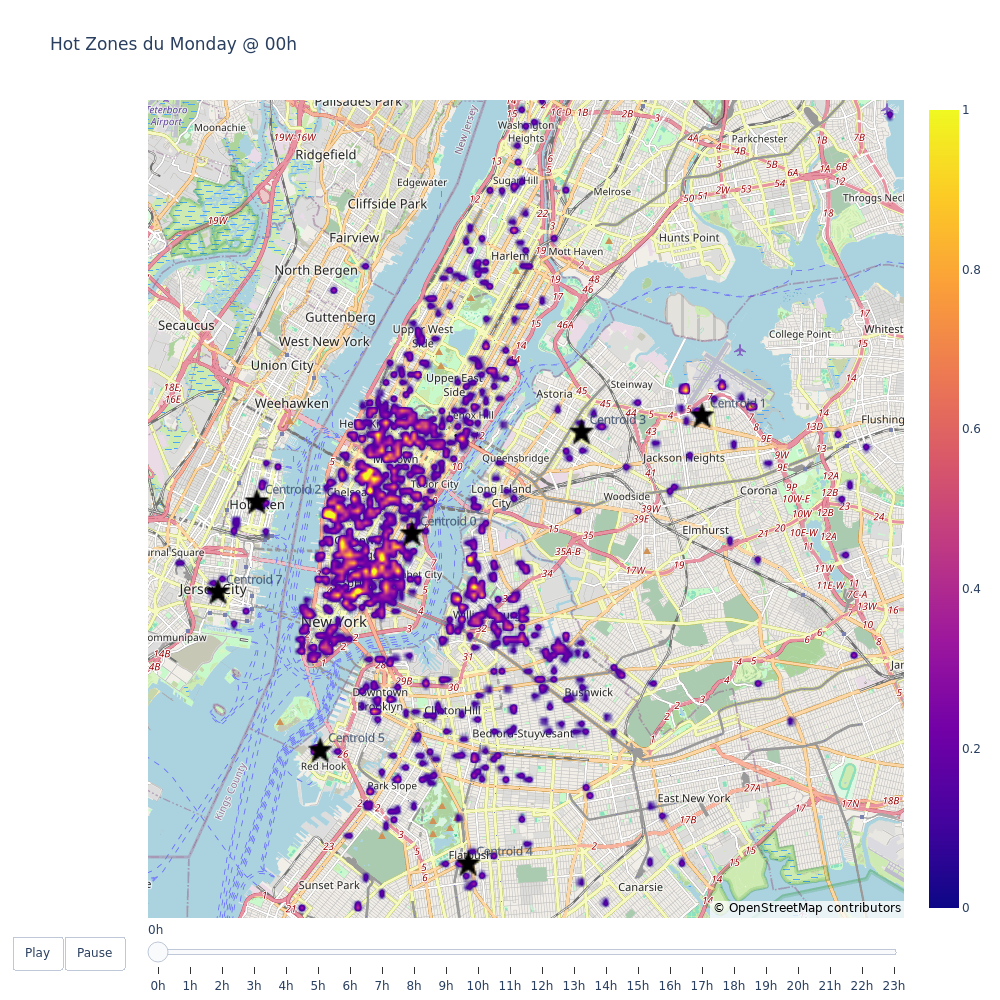

In [51]:
monday_fig = make_weekday_animation(0, report_viz_df)
monday_fig.show()

#### Mercredi

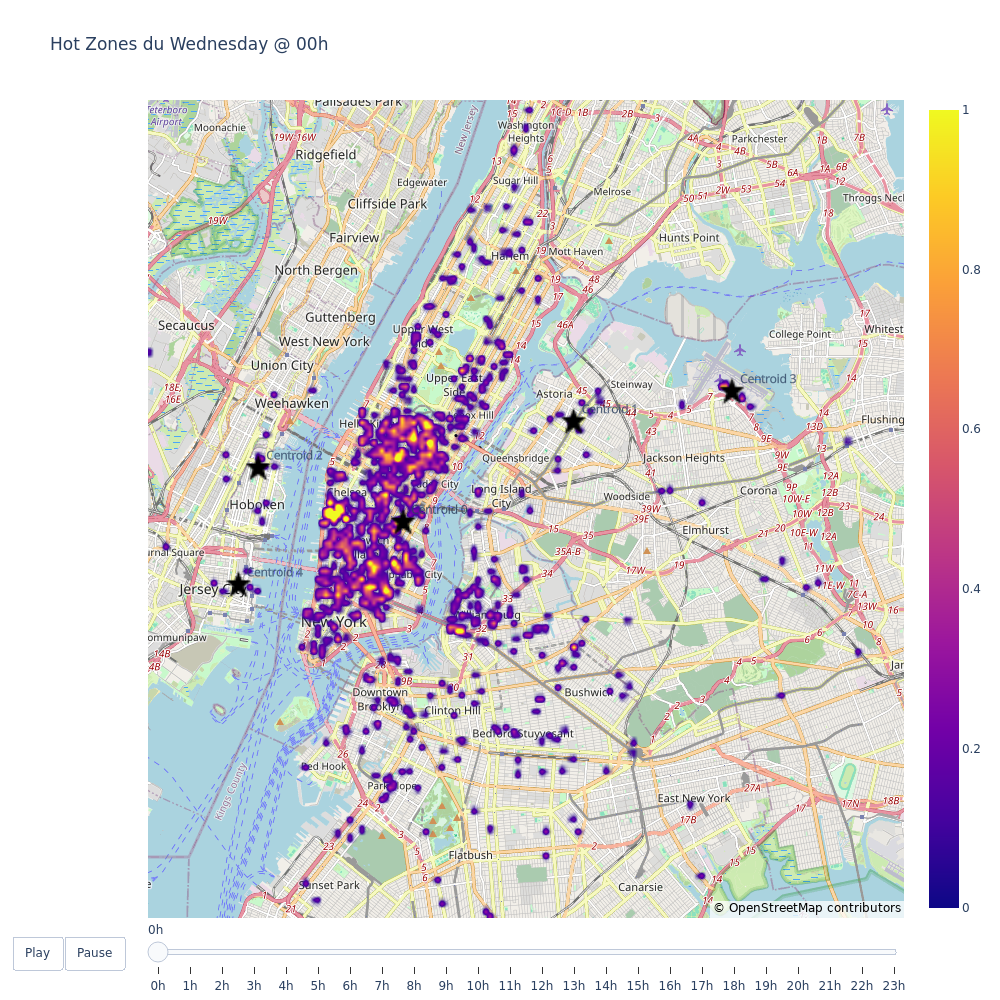

In [48]:
wednesday_fig = make_weekday_animation(2, report_viz_df)
wednesday_fig.show()

#### Samedi

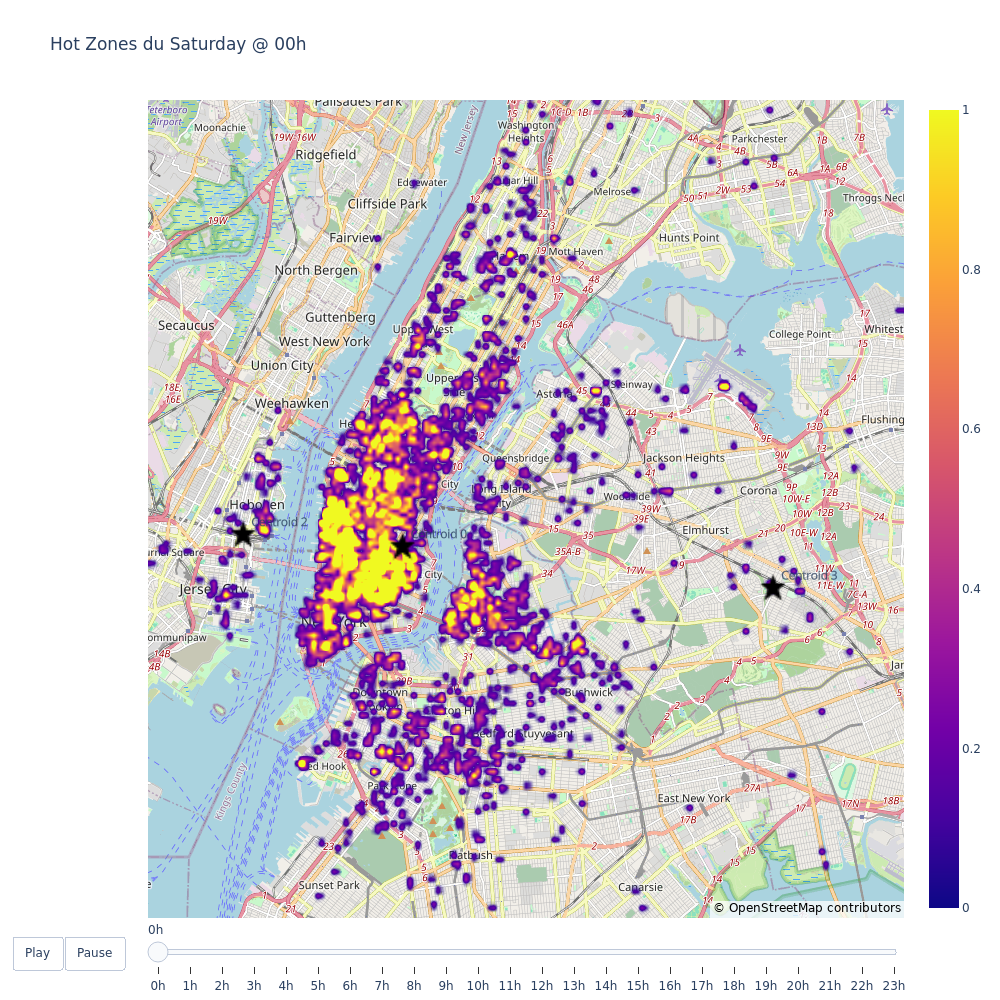

In [49]:
saturday_fig = make_weekday_animation(5, report_viz_df)
saturday_fig.show()

In [ ]:
# weekday_figs = {w: make_weekday_animation(w, report_viz_df) for w in range(7)}

# for i in weekday_figs:
#     fig = weekday_figs[i]
#     fig.show()

#### Animation export

In [50]:
# Exporting one animation to animated gif
from moviepy import VideoClip
from PIL import Image

def plotly_fig2array(fig):
    # convert Plotly fig to  an array
    fig_bytes = fig.to_image(format="png")
    buf = io.BytesIO(fig_bytes)
    img = Image.open(buf)
    return np.asarray(img)

fig = wednesday_fig

def make_frame(t):
    frame_id = int(t)
    frame = fig.frames[frame_id]

    for i, trace in enumerate(frame.data):
        fig.data[i].lat = trace.lat if hasattr(trace, 'lat') else fig.data[i].lat
        fig.data[i].lon = trace.lon if hasattr(trace, 'lon') else fig.data[i].lon

    fig.layout.sliders[0].active = frame_id

    fig.layout.update()
    return plotly_fig2array(fig)

animation = VideoClip(make_frame, duration=24)
animation.write_gif("./assets/wednesday_hot_zones_animation.gif", fps=1)

MoviePy - Building file ./assets/wednesday_hot_zones_animation.gif with imageio.


#### Last words

Avec l'animation du mercredi on voit bien que la zone de plus forte densité (**sud de Manhattan**) conserve son cluster quelque soit l'heure de la journée. C'est clairement ***the place to be*** pour les chauffeurs!